In [1]:
#Lambda = 1 - alpha*(1 - exp(1)^(1beta*t))


In [2]:
library(ape)
library(phangorn)

In [3]:
tr <- rtree(10)

In [4]:
aln1 <- as.DNAbin(simSeq(tr))

In [5]:
aln1

10 DNA sequences in binary format stored in a matrix.

All sequences of same length: 1000 

Labels: t6 t1 t3 t2 t7 t9 ...

Base composition:
    a     c     g     t 
0.247 0.259 0.247 0.247 

In [6]:
aln12 <- aln1[, -seq(from = 3, to = ncol(aln1), by = 3)]

In [7]:
aln12

10 DNA sequences in binary format stored in a matrix.

All sequences of same length: 667 

Labels: t6 t1 t3 t2 t7 t9 ...

Base composition:
    a     c     g     t 
0.251 0.258 0.244 0.247 

In [8]:
tr <- rtree(10)
tr12 <- tr
tr12$edge.length <- runif(length(tr$edge.length))
tr3 <- tr
tr3$edge.length <- runif(length(tr$edge.length))

tr_divided <- tr
tr_divided$edge.length <- tr12$edge.length / tr3$edge.length

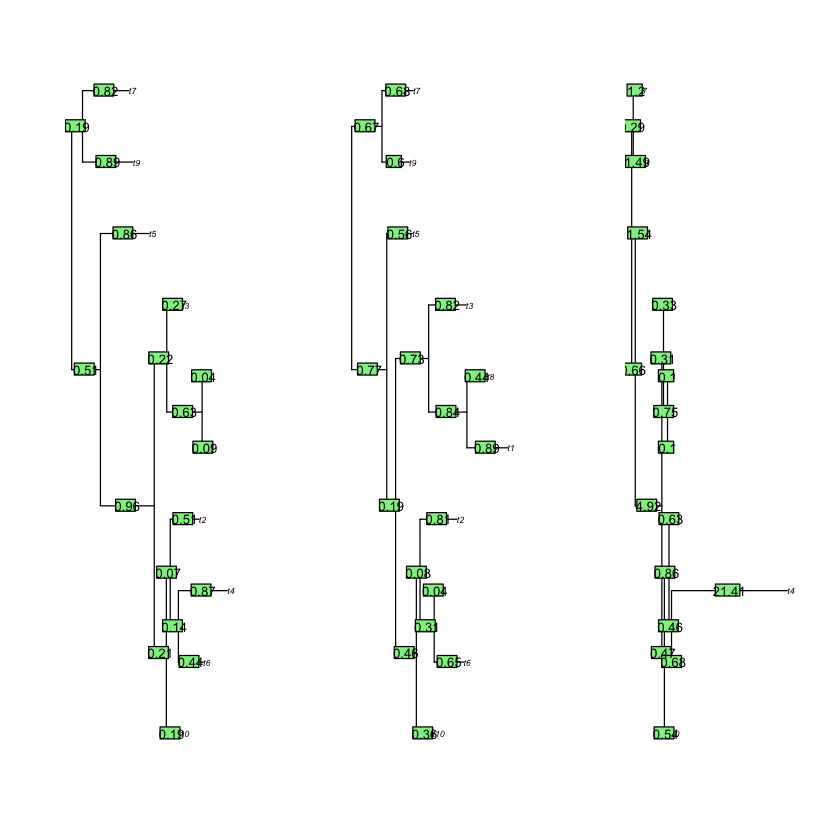

In [9]:
par(mfrow = c(1, 3))
plot(tr12)
edgelabels(round(tr12$edge.length, 2))
plot(tr3)
edgelabels(round(tr3$edge.length, 2))
plot(tr_divided)
edgelabels(round(tr_divided$edge.length, 2))

In [246]:
get_likelihood <- function(data, par){
    rate <- data$rate
    time <- data$time
    alpha <- par[1]
    beta <- par[2]
    rate_fit <- (1 - alpha*(1-exp(1)^(-beta*time)  ))
    return(-log(mean((rate_fit - rate)^2)))
}

get_prior <- function(par){
    log(dnorm(par[1], 1, 1))+log(dnorm(par[2], 0.1, 1))
}


prior <- get_prior(c(3, 4))
lik <- get_likelihood(data_rates, c(0.99, 0.09))
lik
prior

[1] 4.499617

[1] -11.44288

In [247]:
#try_mcmc
out_frame <- data.frame(step=1:100000, likelihood = rep(NA, 10000), prior = rep(NA, 10000),
                        posterior = rep(NA, 10000), alpha = rep(NA, 10000), 
                        beta = rep(NA, 10000) )

likelihood1 <- get_likelihood(data_rates, c(1, 0.1))
prior1 <- get_prior(c(1, 0.1))
posterior1 <- likelihood1+prior1

out_frame[1, 2:6] <- c(likelihood1, prior1, posterior1, 1, 0.1)
head(out_frame)

,step,likelihood,prior,posterior,alpha,beta
1,1,4.520085,-1.837877,2.682208,1,0.1
2,2,NA,NA,NA,NA,NA
3,3,NA,NA,NA,NA,NA
4,4,NA,NA,NA,NA,NA
5,5,NA,NA,NA,NA,NA
6,6,NA,NA,NA,NA,NA


In [248]:
#step2
accept <- 0
reject <- 0
for(i in 2:nrow(out_frame)){
    par_proposal <- as.numeric(out_frame[i-1, 5:6]+rnorm(2, 0, 0.05))
    prior_proposal <- get_prior(par_proposal)
    lik_proposal <- get_likelihood(data_rates, par_proposal)
    posterior_proposal <- prior_proposal+lik_proposal

    if(posterior_proposal > out_frame$posterior[i-1]){
        accept <- accept+1
        out_frame[i, 2:6] <- c(lik_proposal, prior_proposal, posterior_proposal, 
                               par_proposal)
    }else{
        eprev <- exp(out_frame$posterior[i-1])
        epnew <- exp(posterior_proposal)
        mh <- epnew/eprev
        if(mh > runif(1)){
            accept <- accept+1
            out_frame[i, 2:6] <- c(lik_proposal, prior_proposal, posterior_proposal, 
                                    par_proposal)
        }else{
            reject <- reject+1
            out_frame[i, 2:6] <- out_frame[i-1, 2:6]
        }
    }

    
}

In [249]:
accept
reject

[1] 82829

[1] 17170

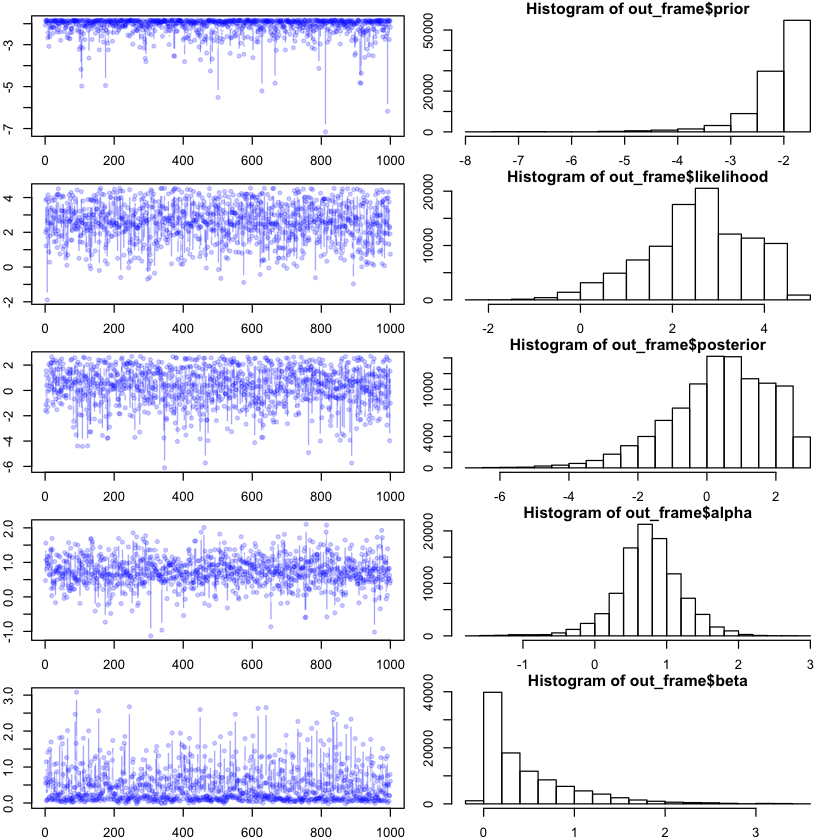

In [269]:
par(mfcol = c(5, 2))
par(mar = c(2, 2, 1, 1))
plot(sample(out_frame$prior, 1000), pch = 20, type = 'b', col = rgb(0, 0, 1, 0.2))
plot(sample(out_frame$likelihood, 1000), pch = 20, type = 'b', col = rgb(0, 0, 1, 0.2))
plot(sample(out_frame$posterior, 1000), pch = 20, type = 'b', col = rgb(0, 0, 1, 0.2))
plot(sample(out_frame$alpha, 1000), pch = 20, type = 'b', col = rgb(0, 0, 1, 0.2))
plot(sample(out_frame$beta, 1000), pch = 20, type = 'b', col = rgb(0, 0, 1, 0.2))

hist(out_frame$prior)
hist(out_frame$likelihood)
hist(out_frame$posterior)
hist(out_frame$alpha)
hist(out_frame$beta)



In [273]:
mcmc_hpds <- sapply(1:ncol(out_frame), function(x) quantile(out_frame[1000:ncol(out_frame), x], c(0.025, 0.975)))

In [274]:
mcmc_means <- sapply(1:ncol(out_frame), function(x) mean(out_frame[1000:ncol(out_frame), x]))

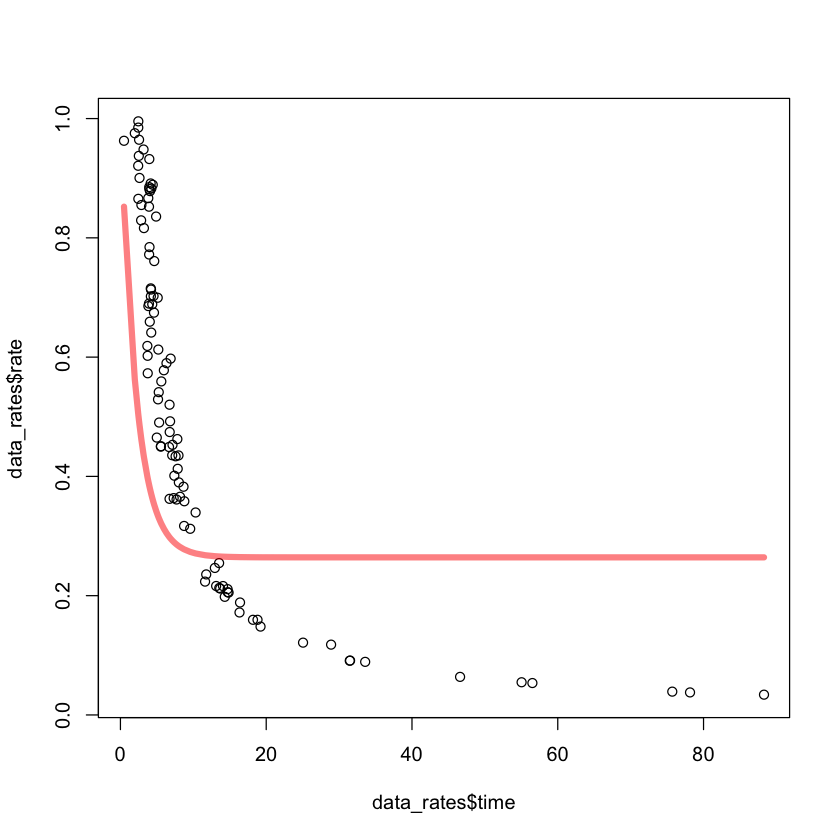

In [288]:
fitted_vals <- (1 - mcmc_means[5]*(1-exp(1)^(-mcmc_means[6]*sort(data_rates$time))))
plot(data_rates$time, data_rates$rate)
lines(sort(data_rates$time), fitted_vals,  col = rgb(1, 0, 0, 0.5), lwd = 5)

for(i in 1:100){
    n_samp <- 1:nrow(out_frame)
    fitted_temp <- (1 - out_frame$alpha[n_samp]*(1-exp(1)^(-out_frame$beta[n_samp]*sort(data_rates$time))))
}

In [289]:
fitted_temp

[1]  9.522186e-01  8.268079e-01  7.915703e-01  8.516214e-01  8.531418e-01
     [6]  8.643569e-01  9.189284e-01  9.555609e-01  9.261598e-01  9.131703e-01
    [11]  8.415262e-01  8.271088e-01  8.245846e-01  7.609779e-01  7.541654e-01
    [16]  8.376820e-01  8.347403e-01  8.342541e-01  6.085121e-01  5.862228e-01
    [21]  5.849391e-01  5.837816e-01  6.652767e-01  6.651840e-01  6.635659e-01
    [26]  6.665795e-01  6.593596e-01  6.609921e-01  7.152574e-01  5.870009e-01
    [31]  7.340757e-01  7.111735e-01  5.961711e-01  6.105153e-01  5.693220e-01
    [36]  5.662042e-01  5.238913e-01  6.004317e-01  5.737286e-01  5.627136e-01
    [41]  5.760337e-01  5.924468e-01  5.169383e-01  5.828597e-01  6.407687e-01
    [46]  6.226950e-01  6.220923e-01  7.098619e-01  6.543747e-01  6.833170e-01
    [51]  7.025650e-01  8.620105e-01  8.620056e-01  9.102603e-01  8.176436e-01
    [56]  7.759948e-01  7.776320e-01  7.823141e-01  7.478092e-01  7.468641e-01
    [61]  7.271848e-01  7.247175e-01  7.226605e-01  7.554489e-01  7.074208e-01
    [66]  6.374912e-01  5.264859e-01  5.220069e-01  5.125627e-01  5.256683e-01
    [71]  4.345252e-01  3.975337e-01  3.257967e-01  2.464805e-01  2.015369e-01
    [76]  2.672568e-01  2.779671e-01  2.829588e-01  2.470432e-01  2.657701e-01
    [81]  2.479978e-01  2.479930e-01  2.530772e-01  2.669759e-01  2.303641e-01
    [86]  2.303631e-01  2.516443e-01  1.748523e-01  2.243233e-01  1.890031e-01
    [91]  1.663288e-01  9.407758e-02  1.069403e-01  1.319921e-01  1.842318e-01
    [96]  1.993913e-01  2.247213e-01  3.110544e-01  2.946577e-01  2.634800e-01
   [101]  7.313343e-01  3.978998e-01  4.193528e-01  4.187323e-01  4.608686e-01
   [106]  4.724065e-01  4.447044e-01  4.253970e-01  4.930545e-01  4.839864e-01
   [111]  4.476612e-01  3.707691e-01  3.800444e-01  3.380272e-01  2.826703e-01
   [116]  2.824631e-01  2.332000e-01  2.235395e-01  2.719345e-01  3.645270e-01
   [121]  3.904288e-01  4.614960e-01  3.764400e-01  3.244465e-01  3.467558e-01
   [126]  2.708521e-01  2.556576e-01  2.642969e-01  2.639874e-01  2.157617e-01
   [131]  2.154538e-01  2.612833e-01  2.050662e-01  2.422506e-01  1.424715e-01
   [136]  2.038313e-01  2.054760e-01  1.988639e-01  1.975753e-01  2.011595e-01
   [141]  2.591966e-01  2.255056e-01  2.210023e-01  2.623358e-01  3.167620e-01
   [146]  2.947310e-01  2.360543e-01  1.646766e-01  2.170969e-01  2.057734e-01
   [151]  2.051929e-01  2.117436e-01  1.803339e-01  2.123722e-01  1.262234e-01
   [156]  1.261151e-01  1.658949e-01  1.765129e-01  2.884543e-01  2.882297e-01
   [161]  2.819984e-01  2.930107e-01  2.927709e-01  3.313122e-01  3.357271e-01
   [166]  3.496039e-01  3.314769e-01  2.992006e-01  2.991470e-01  3.398443e-01
   [171]  3.810153e-01  2.802251e-01  2.047310e-01  2.086722e-01  2.761913e-01
   [176]  3.308368e-01  2.673231e-01  3.541901e-01  3.357785e-01  3.551504e-01
   [181]  4.471419e-01  4.641708e-01  4.119120e-01  3.800099e-01  3.789183e-01
   [186]  3.789182e-01  3.419652e-01  3.346402e-01  3.605141e-01  3.272302e-01
   [191]  3.650714e-01  3.733953e-01  3.160508e-01  3.020801e-01  3.263316e-01
   [196]  2.864316e-01  3.183169e-01  3.538300e-01  3.615953e-01  4.026768e-01
   [201]  8.226293e-01  5.915244e-01  5.553115e-01  5.475539e-01  5.805720e-01
   [206]  5.833956e-01  5.051649e-01  5.111311e-01  5.314592e-01  5.805489e-01
   [211]  5.770372e-01  5.462296e-01  4.977028e-01  4.551238e-01  3.869690e-01
   [216]  4.079921e-01  4.010026e-01  3.913217e-01  3.878500e-01  3.557950e-01
   [221]  3.053352e-01  2.618347e-01  3.482899e-01  3.436324e-01  3.192370e-01
   [226]  2.742769e-01  3.217386e-01  3.190867e-01  2.256273e-01  3.096199e-01
   [231]  3.236385e-01  2.339186e-01  2.921252e-01  2.899716e-01  2.997889e-01
   [236]  2.278593e-01  1.769807e-01  1.763306e-01  1.909198e-01  2.218532e-01
   [241]  2.758627e-01  2.237341e-01  3.149826e-01  2.950079e-01  2.943303e-01
   [246]  2.937344e-01  3.080845e-01  3.070248e-01  3.033437e-01  2.692332e-01
   [251]  3.118770e-01  2.836919e-01  3.546144e-01  3.2